In [139]:
%run -i "../Retropy_framework.py"

iPy: True


https://www.bdcinvestor.com/bdc-etfs
http://etfdb.com/compare/dividend-yield/

In [148]:
priv_equity_all = [PEX, PSP] # also: LSE:IPRV
priv_equity = [PSP]
biz_dev_all = [BIZD, BDCS, BDCL, BDCZ, BUY]
biz_dev = [BDCS, BDCL]
mort = [MORL, REML, REM]
alts = [ALTY]
corp_bonds = [cjb, ANGL]
reg_bonds = [gb, AGG, EDV]
div_stocks = [SDIV, DIV, DVY, SMHD]
mlp = [AMZA, AMJL, YMLP, MLPQ, ZMLP]
other = [FPE, CEFL, QYLD]

Fetching QYLD from AV .. DONE


In [149]:
all = get(priv_equity + biz_dev + mort + alts + corp_bonds + reg_bonds + div_stocks + mlp + other + [SPY, VXUS])
[x.name for x in get(all, despike=True, trim=True, reget=True)]

trimmed data from 1995-01-03 [VWEHX = cjb, VFITX = gb, +3 more] to 2016-07-13 [REML]


['PSP',
 'BDCS',
 'BDCL',
 'MORL',
 'REML',
 'REM',
 'ALTY',
 'VWEHX = cjb',
 'ANGL',
 'VFITX = gb',
 'AGG',
 'EDV',
 'SDIV',
 'DIV',
 'DVY',
 'SMHD',
 'AMZA',
 'AMJL',
 'YMLP',
 'MLPQ',
 'ZMLP',
 'FPE',
 'CEFL',
 'QYLD',
 'SPY',
 'VXUS']

dropped: FPE, ALTY
trimmed data from 1995-01-03 [VWEHX = cjb, SPY] to 2012-04-11 [ANGL]
trimmed data from 1995-01-03 [VWEHX, SPY] to 2012-04-11 [ANGL]


showRiskReturn: Cannot auto-trim with list-items


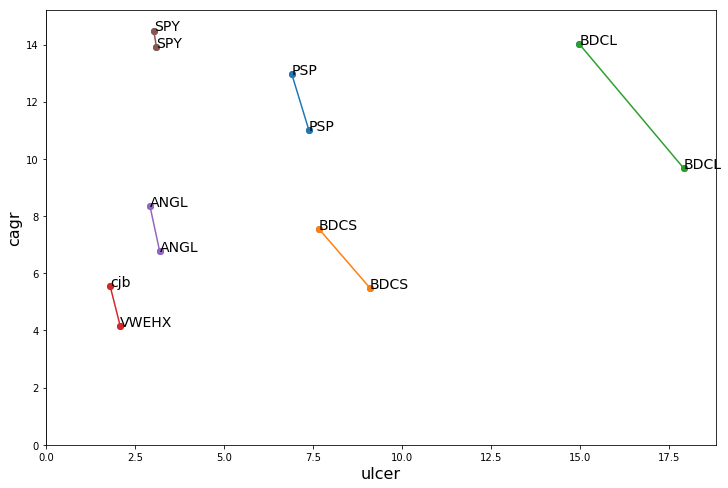

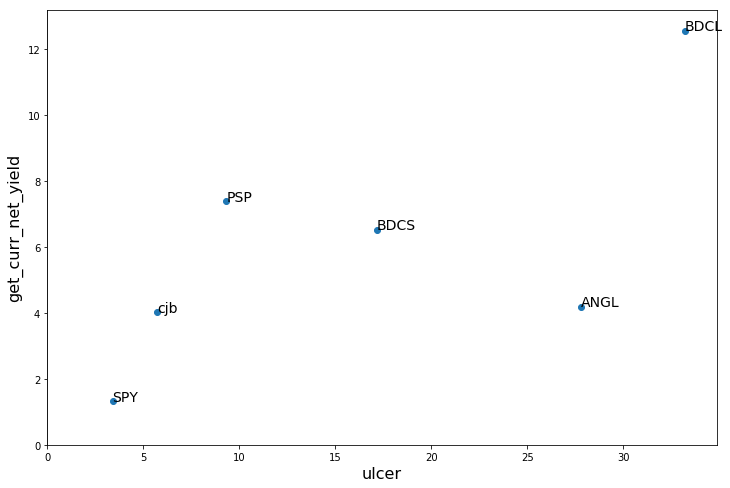

In [38]:
all = get(all, mode="PR", reget=True, start=2013)
show_risk_return_ntr_mode(all)
showRiskReturn(*all, ret_func=get_curr_net_yield)
show(all)

In [39]:
yld = lmap(getYield, all)
show(yld, range(0, 20, 1), ta=False, log=False)

In [6]:
# TICC, FSC
# TCAP - changed symbol name
bdc_comps = [ 'ABDC','ACSF','AINV','ARCC','BKCC','CPTA','CODI','EQS','FDUS','GARS','GLAD','GAIN','GBDC','GECC','HCAP','HTGC','HRZN','KCAP','MAIN','MCC','MRCC','MVC','NMFC','OFS','OHAI','OXLC','PFLT','PNNT','PSEC','SLRC','SUNS','SCM','CGBD','TCPC','TCRD','TSLX','TPVG','WHF']
all = get(bdc_comps, source="Y")

In [40]:
#show(getMedianSer(lmap(get_income, all)), ta=False, log=False)

In [8]:
#all = [x for x in all if x.shape[0]>0]
t = get("BDCS", mode="NTR")
all2 = get(all, trim=True, start=2005, mode="NTR")
pred = lrret(t, all2, return_pred=True, fit_values=True)

dropped: GAIN@Y, PFLT@Y, HTGC@Y, ABDC@Y, SUNS@Y, GECC@Y, KCAP@Y, TCRD@Y, MCC@Y, CGBD@Y, BKCC@Y, TPVG@Y, CODI@Y, HCAP@Y, FDUS@Y, OFS@Y, OXLC@Y, GBDC@Y, PNNT@Y, TCPC@Y, SLRC@Y, HRZN@Y, SCM@Y, ACSF@Y, MAIN@Y, MRCC@Y, TSLX@Y, CPTA@Y, NMFC@Y, WHF@Y, GARS@Y
trimmed data from 1992-09-11 [EQS@Y] to 2004-11-10 [OHAI@Y]


R^2: 0.9307007217277167
PSEC@Y   0.3556
AINV@Y   0.2654
ARCC@Y   0.2470
OHAI@Y   0.0578
MVC@Y    0.0363
GLAD@Y   0.0000
EQS@Y    0.0000
dtype: float64


trimmed data from 1990-01-02 [VFINX] to 2004-11-10 [BDCS - fit]


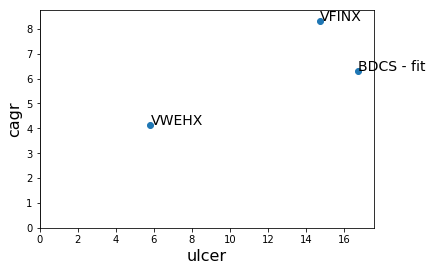

In [9]:
lst = get([pred, lc, cjb], mode="NTR")
show(lst, trim=True)
showRiskReturn(*lst)
show(lmap(dd, lst))
#show(BDCS)

In [33]:
lrret(BDCL, BDCS, freq="M", pos_weights=False, sum1=False, fit_values=True)

R^2: 0.981875104056143


BDCS   1.7352
dtype: float64

In [56]:
#all = get(["PSP", "BDCS", "BDCL", "MORL", "SPY", cjb, "SDIV", "DIV", "DVY"], trim=True, source="AV", start=2012)



dropped: ALTY, FPE
trimmed data from 1995-01-03 [VWEHX = cjb, SPY] to 2012-04-11 [ANGL]


In [109]:

def analyze_assets(all):
    show_risk_return_ntr_mode(all)
    
    show(lmap(adj_inf, lmap(price, all)), 1, title="real price")

    income = lmap(get_income, all)
    show(income, income[0].mean(), 0, ta=False, log=False, title="net income")

    show(lmap(roi, all), ta=False, log=False, title="net ROI")

    yields = lmap(get_real_yield, all)
    yields[0] = ma(yields[0], 8).dropna()
    show(yields, 0, ta=False, log=False, title="real gross yield")

    yields = lmap(getYield, all)
    yields[0] = ma(yields[0], 8).dropna()
    show(yields, get_inflation(365*7)[getCommonDate(yields, agg=min):], 0, ta=False, log=False, title="nominal gross yield")    
    
    lrret_mutual(all)

dropped: AMJL, REML, MLPQ
trimmed data from 1995-01-03 [VWEHX = cjb, VFITX = gb, +3 more] to 2015-07-14 [ALTY]
trimmed data from 1995-01-03 [VWEHX, VFITX, +3 more] to 2015-07-14 [ALTY]


showRiskReturn: Cannot auto-trim with list-items



Cross:
trimmed data from 2015-07-14 [PSP, BDCS, +23 more] to 2015-07-14 [PSP, BDCS, +23 more]
PSP: VXUS:73.5|MORL:13.9|QYLD:9.1|YMLP:2.6|SPY:0.9   R^2: 0.915
BDCS: BDCL:48.8|DVY:8.4|SMHD:0.3|EDV:0.3   R^2: 0.995
BDCL: BDCS:57.0|SMHD:43.0   R^2: 0.918
MORL: SMHD:57.9|CEFL:42.1   R^2: 0.554
REM: MORL:48.1|QYLD:6.8|DVY:4.4|gb:0.3   R^2: 0.995
ALTY: SDIV:21.2|EDV:17.8|BDCS:12.7|ANGL:11.9|CEFL:11.4|DVY:7.2|BDCL:6.7|QYLD:5.3|DIV:3.6|SMHD:1.7|MORL:0.5   R^2: 0.953
cjb: ANGL:29.2|FPE:23.2|gb:13.6|PSP:9.0|BDCL:1.9|YMLP:1.1|MORL:0.2   R^2: 0.970
ANGL: cjb:54.3|CEFL:17.9|DVY:16.8|SMHD:8.1|EDV:2.8   R^2: 0.901
gb: EDV:17.4|AGG:13.1|ZMLP:0.2   R^2: 0.788
AGG: gb:62.1|FPE:7.5|EDV:6.7|ANGL:3.9|SPY:1.4|VXUS:1.2   R^2: 0.992
EDV: AGG:59.9|gb:38.9|CEFL:1.1   R^2: 0.494
SDIV: DIV:24.4|VXUS:23.5|ALTY:15.4|EDV:8.5|SMHD:6.8|gb:6.0|CEFL:5.5|ZMLP:4.9|DVY:1.7   R^2: 0.962
DIV: SDIV:28.4|DVY:10.9|EDV:7.8|QYLD:6.9|MORL:3.4|REM:2.6|SMHD:2.4|ZMLP:2.0   R^2: 0.868
DVY: SPY:62.0|EDV:16.2|SMHD:12.7|ANGL:9.1   R^2: 0

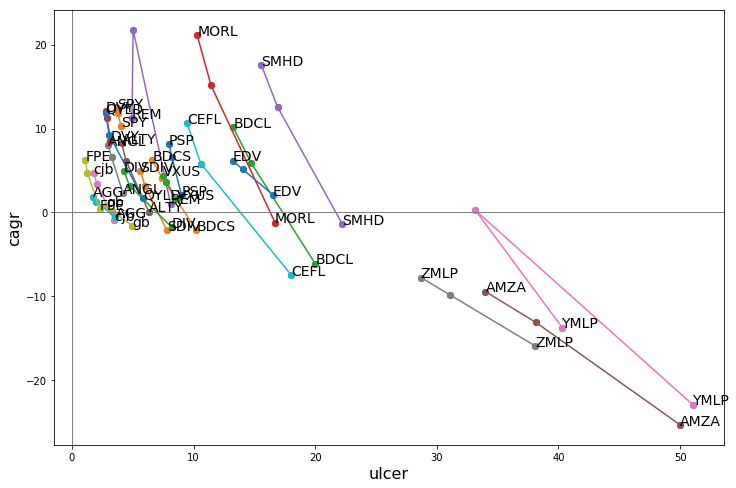

<Figure size 864x576 with 0 Axes>

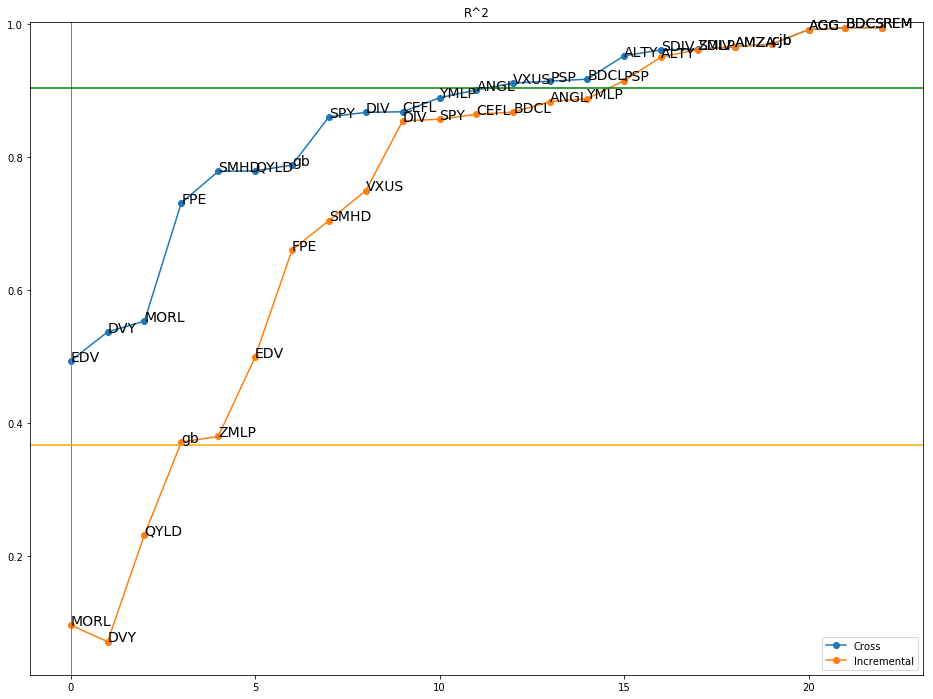

In [158]:
analyze_assets(get(all, start=2016, trim=True, despike=True))

In [98]:
# PSP is very similar to VXUS in price return
show(PSP/SPY, get("PSP", mode="PR")/get("SPY", mode="PR"), get("PSP", mode="PR")/get("VXUS", mode="PR"), PSP/VXUS, SPY)
show(get("PSP", mode="PR"), get("VXUS", mode="PR"))

trimmed data from 1995-01-03 [SPY] to 2011-01-28 [PSP / VXUS, PSP / VXUS]


trimmed data from 2006-10-24 [PSP] to 2011-01-28 [VXUS]
